# Loading mp3 file

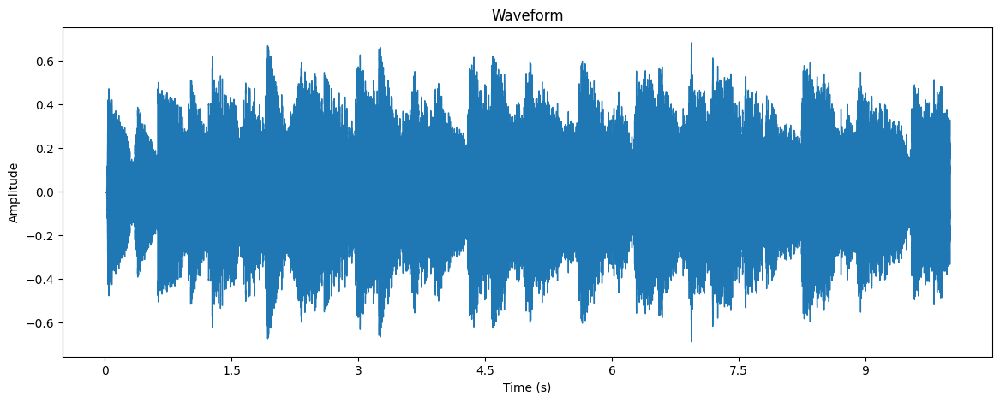

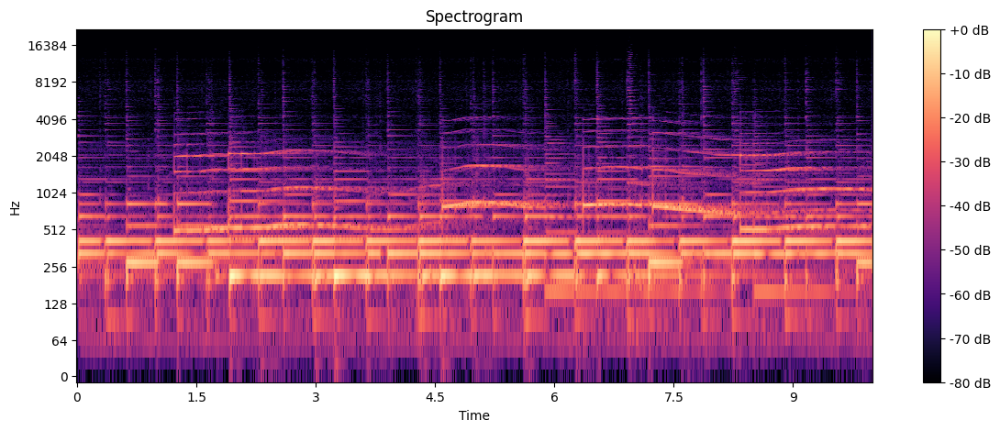

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/librosa/feature/spectral.py:2148: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


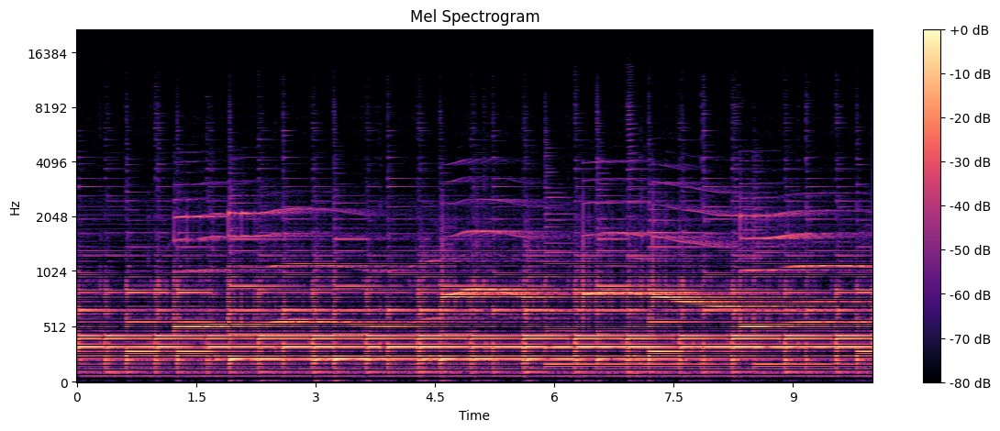

Waveform shape: (441000,)
Spectrogram shape: (1025, 862)
Mel Spectrogram shape: (128, 862)
Waveform max: 0.6861494183540344, min: -0.6708768010139465
Spectrogram max: 276.6595458984375, min: 5.603381314500666e-09
Mel Spectrogram max: 2900.0556640625, min: 6.470792651702695e-11
Waveform log max: -0.3766598701477051, min: nan
Spectrogram log max: 5.6227874755859375, min: -18.999895095825195
Mel Spectrogram log max: 7.972485065460205, min: -23.461137771606445


/var/folders/1s/z220kbn525j9yjx9gm24pbv40000gn/T/ipykernel_19273/2390117981.py:63: RuntimeWarning: invalid value encountered in log
  print(f"Waveform log max: {np.log(np.max(y))}, min: {np.log(np.min(y))}")


In [2]:
# load a mp3 file
file_directory = 'fma_small'

import os
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

def load_mp3(file_path):
    # Load the mp3 file
    y, sr = librosa.load(file_path, sr=44100)
    return y, sr

def plot_waveform(y, sr):
    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(y, sr=sr)
    plt.title('Waveform')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.show()
    
def plot_spectrogram(y, sr):
    plt.figure(figsize=(14, 5))
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.show()
    
def plot_mel_spectrogram(y, sr):
    plt.figure(figsize=(14, 5))
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft = 4096, n_mels=1024, fmax=sr/2)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    plt.show()
    
# test
file_path = os.path.join(file_directory, '012/012053.mp3')
y, sr = load_mp3(file_path)

# only use the first 10 seconds
y = y[:10 * sr]


plot_waveform(y, sr)
plot_spectrogram(y, sr)
plot_mel_spectrogram(y, sr)

# print the shape of the waveform, spectrogram, and mel spectrogram
print(f"Waveform shape: {y.shape}")
print(f"Spectrogram shape: {np.abs(librosa.stft(y)).shape}")
print(f"Mel Spectrogram shape: {librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000).shape}")

# print max and min values of the waveform, spectrogram, and mel spectrogram
print(f"Waveform max: {np.max(y)}, min: {np.min(y)}")
print(f"Spectrogram max: {np.max(np.abs(librosa.stft(y)))}, min: {np.min(np.abs(librosa.stft(y)))}")
print(f"Mel Spectrogram max: {np.max(librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000))}, min: {np.min(librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000))}")

# print log(max and min values of the waveform, spectrogram, and mel spectrogram)
print(f"Waveform log max: {np.log(np.max(y))}, min: {np.log(np.min(y))}")
print(f"Spectrogram log max: {np.log(np.max(np.abs(librosa.stft(y))))}, min: {np.log(np.min(np.abs(librosa.stft(y))))}")
print(f"Mel Spectrogram log max: {np.log(np.max(librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)))}, min: {np.log(np.min(librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)))}")

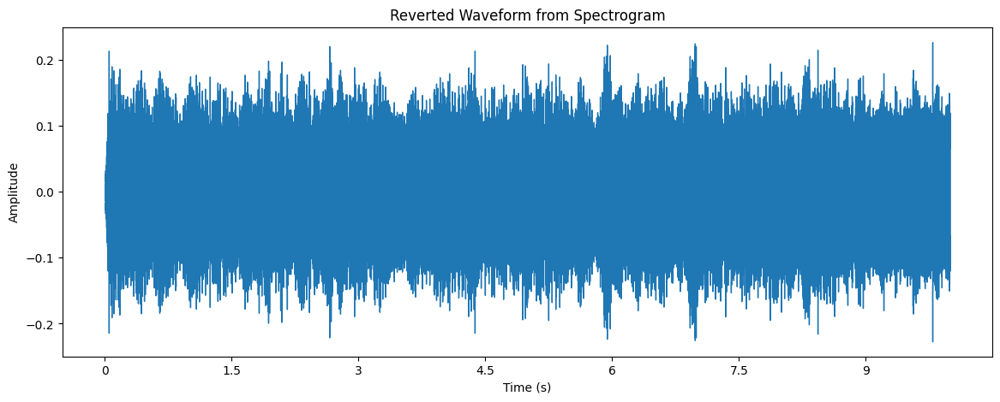

Loss between original and reconstructed waveform: 0.036218


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/librosa/feature/inverse.py:99: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(


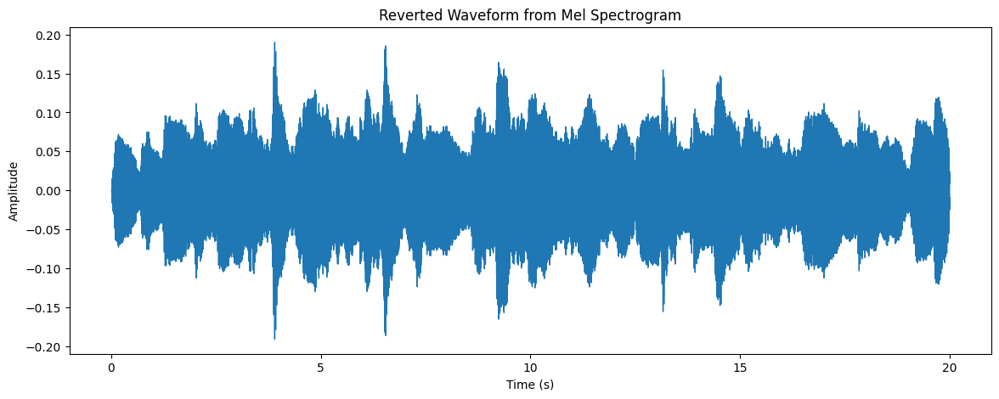

Loss between original and reconstructed waveform from Mel Spectrogram: 0.035756


In [3]:
# revert spectrogram to waveform
def spectrogram_to_waveform(D, sr):
    # Inverse Short-Time Fourier Transform (ISTFT)
    y_inv = librosa.istft(D, )
    return y_inv

# revert mel spectrogram to waveform
def mel_spectrogram_to_waveform(S, sr):
    # Inverse Mel Spectrogram
    S_inv = librosa.feature.inverse.mel_to_stft(S, sr=sr, n_fft=2048*2)
    y_inv = librosa.istft(S_inv)
    return y_inv

# revert the spectrogram to waveform
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
y_inv = spectrogram_to_waveform(D, sr)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y_inv, sr=sr)
plt.title('Reverted Waveform from Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# calculate loss between original and reverted waveform
min_len = min(len(y), len(y_inv))
loss = np.mean((y[:min_len] - y_inv[:min_len]) ** 2)
print(f"Loss between original and reconstructed waveform: {loss:.6f}")

# revert the mel spectrogram to waveform
S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=4096, n_mels=1024, fmax=sr/2)
S_inv = librosa.feature.inverse.mel_to_stft(S, sr=sr)
y_inv_mel = mel_spectrogram_to_waveform(S, sr)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y_inv_mel, sr=sr)
plt.title('Reverted Waveform from Mel Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# calculate loss between original and reverted waveform
min_len = min(len(y), len(y_inv_mel))
loss_mel = np.mean((y[:min_len] - y_inv_mel[:min_len]) ** 2)
print(f"Loss between original and reconstructed waveform from Mel Spectrogram: {loss_mel:.6f}")


In [4]:
# play the original and reverted waveforms
import IPython.display as ipd
ipd.Audio(y, rate=sr)  # Original waveform

In [5]:
ipd.Audio(y_inv, rate=sr)  # Reverted waveform from Spectrogram

In [6]:
ipd.Audio(y_inv_mel, rate=sr)  # Reverted waveform from Mel Spectrogram

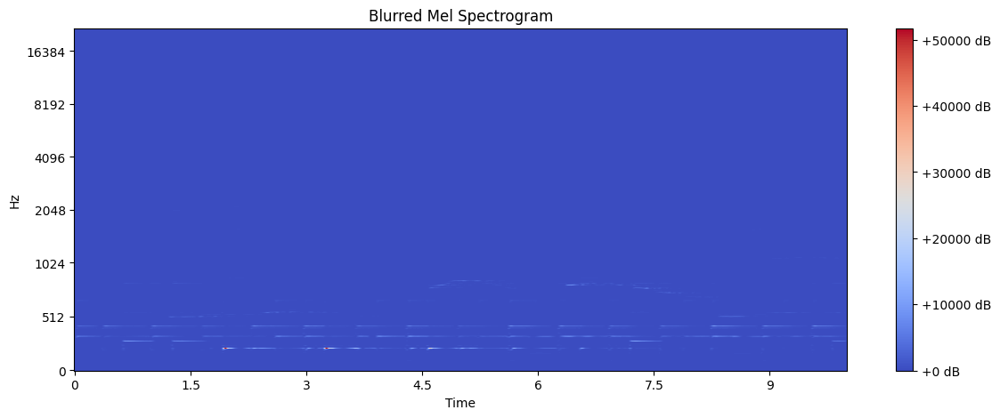

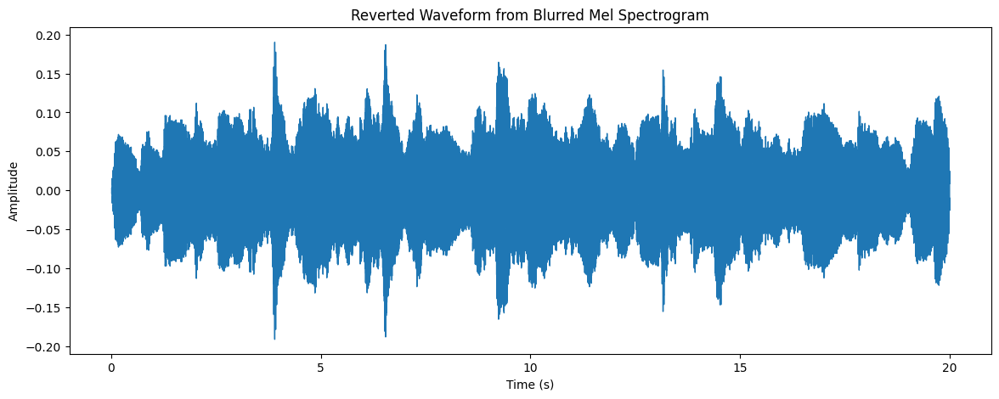

In [7]:
# add random logaritmic noise to the mel spectrogram
def add_random_noise(S, noise_factor=0.005):
    noise = np.random.randn(*S.shape) 
    S_noisy = S + noise_factor * noise
    return S_noisy

# add random noise to the mel spectrogram
S_noisy = add_random_noise(S)
plt.figure(figsize=(14, 5))
librosa.display.specshow(S_noisy, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Blurred Mel Spectrogram')
plt.show()

# revert the blurred mel spectrogram to waveform
S_blurred_inv = librosa.feature.inverse.mel_to_stft(S_noisy, sr=sr)
y_blurred_inv = mel_spectrogram_to_waveform(S_noisy, sr)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y_blurred_inv, sr=sr)
plt.title('Reverted Waveform from Blurred Mel Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

In [8]:
# play blurred waveform
ipd.Audio(y_blurred_inv, rate=sr)  # Reverted waveform from Blurred Mel Spectrogram

# Preprocessing


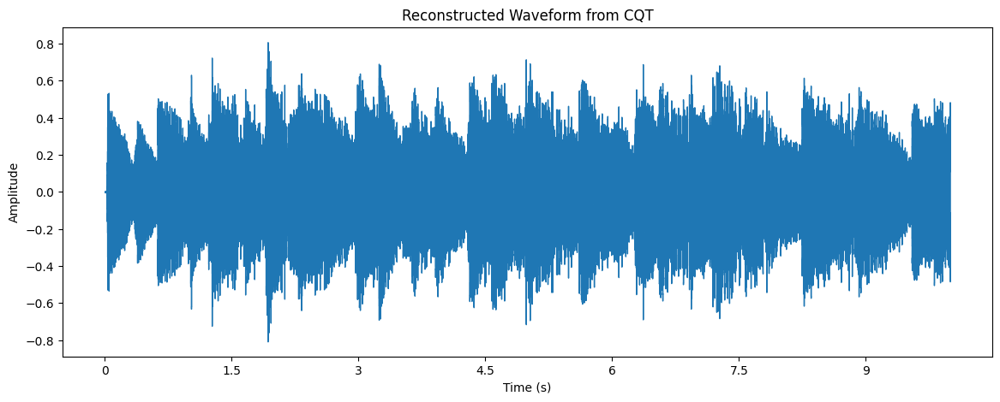

Loss between original and reconstructed waveform from CQT: 0.001017


In [9]:
C = librosa.cqt(y, sr=sr)
y_reconstructed = librosa.icqt(C, sr=sr)  # Inversion (approximate)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y_reconstructed, sr=sr)
plt.title('Reconstructed Waveform from CQT')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# calculate loss between original and reverted waveform
min_len = min(len(y), len(y_reconstructed))
loss_cqt = np.mean((y[:min_len] - y_reconstructed[:min_len]) ** 2)
print(f"Loss between original and reconstructed waveform from CQT: {loss_cqt:.6f}")

# play the reconstructed waveform from CQT
ipd.Audio(y_reconstructed, rate=sr)  # Reverted waveform from CQT

/var/folders/1s/z220kbn525j9yjx9gm24pbv40000gn/T/ipykernel_19273/1830751869.py:25: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  librosa.display.specshow(librosa.amplitude_to_db(D_complex, ref=np.max), sr=sr, x_axis='time', y_axis='log')


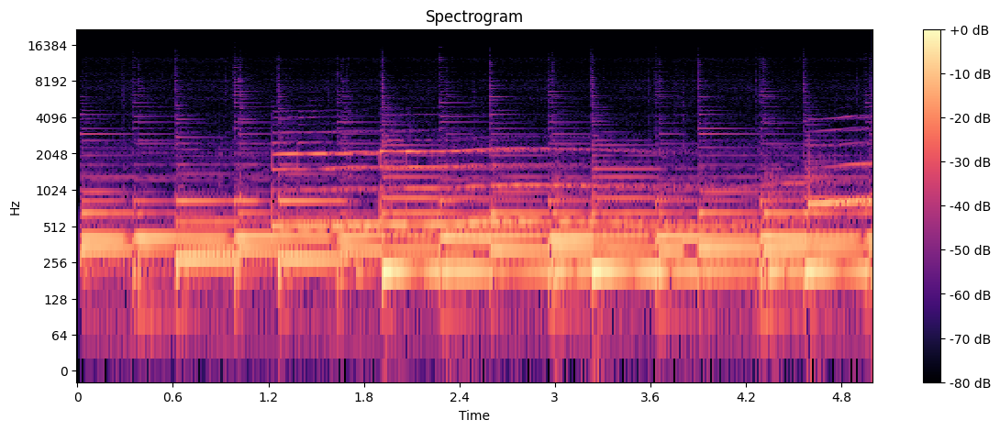

Spectrogram shape: (513, 431)
Amount of pixels: 221103
Amount of pixels in the real part: 220590
Amount of pixels in the imaginary part: 220171


In [49]:
import librosa
import numpy as np

# Load original
y, sr = librosa.load(file_path, sr=44100)

y = y[:5 * sr]  # Use only the first 10 seconds

# STFT with consistent params
n_fft = int(1024)
hop_length = int(512)
window = 'hann'

D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, window=window)
magnitude, phase = np.abs(D), np.angle(D)

# Reconstruct complex spectrogram
D_complex = magnitude * np.exp(1j * phase)

# Invert STFT
y_reconstructed = librosa.istft(D_complex, hop_length=hop_length, window=window, length=len(y))

# plot spectrogram
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.amplitude_to_db(D_complex, ref=np.max), sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()

# print shape of spectrogram
print(f"Spectrogram shape: {D_complex.shape}")

# print amount of pixels
print(f"Amount of pixels: {D.size}")

print(f"Amount of pixels in the real part: {np.count_nonzero(D_complex.real)}")
print(f"Amount of pixels in the imaginary part: {np.count_nonzero(D_complex.imag)}")



AttributeError: QuadMesh.set() got an unexpected keyword argument 'ref'

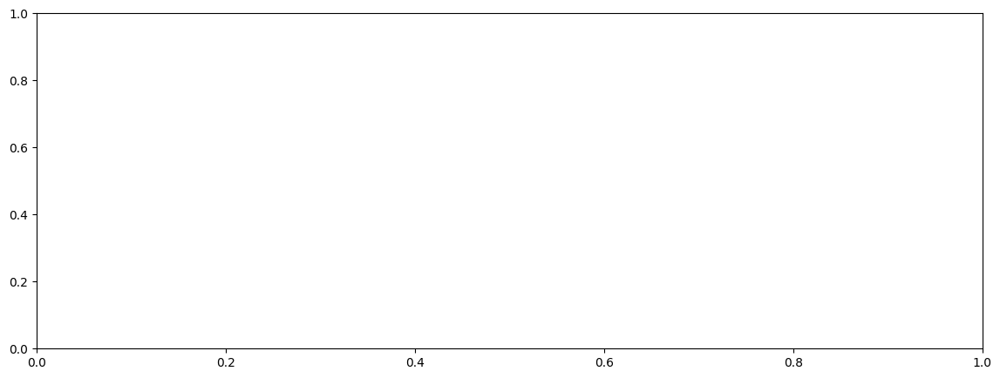

In [ ]:
import librosa
import numpy as np

# Load original
y, sr = librosa.load(file_path, sr=44100, mono=True)

y = y[:5 * sr]  # Use only the first 10 seconds

# STFT with consistent params
n_fft = int(1024)
hop_length = int(512)
window = 'hann'

D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, window=window)
magnitude, phase = np.abs(D), np.angle(D)

# Reconstruct complex spectrogram
D_complex = magnitude * np.exp(1j * phase)

D = D.imag

# Invert STFT
y_reconstructed = librosa.istft(D, hop_length=hop_length, window=window, length=len(y))

# plot spectrogram
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.amplitude_to_db(D.imag, ref=np.max), sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()

# print shape of spectrogram
print(f"Spectrogram shape: {D.shape}")

# print amount of pixels
print(f"Amount of pixels: {D.size}")

print(type(D[0, 0]))

ipd.Audio(y_reconstructed, rate=sr)  # Original waveform

/var/folders/1s/z220kbn525j9yjx9gm24pbv40000gn/T/ipykernel_19273/4218112378.py:1: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  librosa.display.specshow(librosa.amplitude_to_db(D_complex, ref=np.max), sr=sr, x_axis='time')


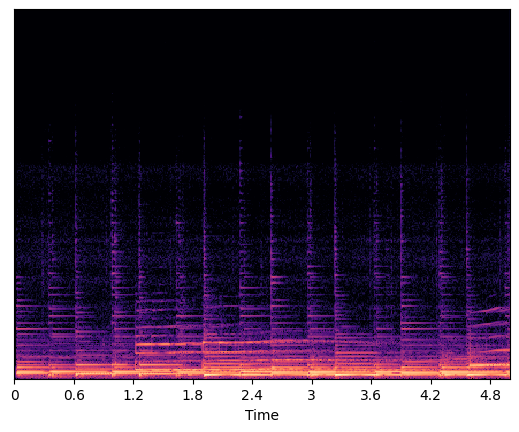

In [31]:
librosa.display.specshow(librosa.amplitude_to_db(D_complex, ref=np.max), sr=sr, x_axis='time')

Reduced Spectrogram shape: (342, 431)
Reduced amount of pixels: 147402


/var/folders/1s/z220kbn525j9yjx9gm24pbv40000gn/T/ipykernel_19273/2325051780.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  librosa.display.specshow(librosa.amplitude_to_db(D_reduced, ref=np.max), sr=sr, x_axis='time')


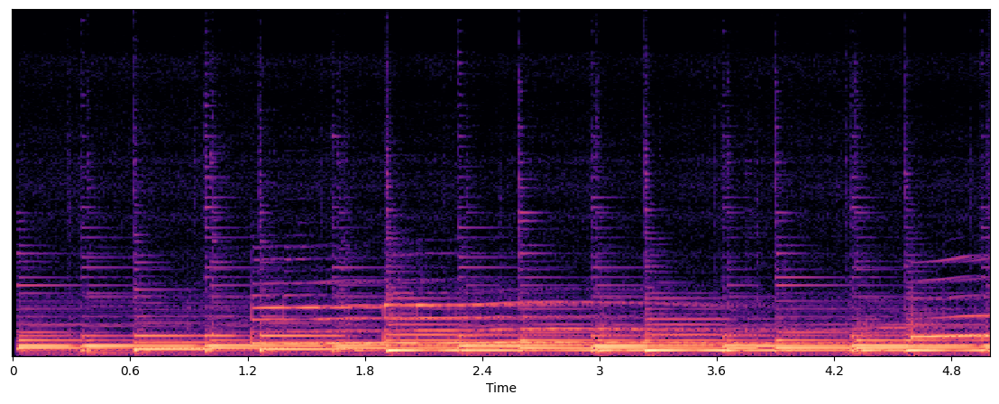

In [44]:
D_reduced = D_complex[:int(D_complex.shape[0] / 1.5), :].copy()
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.amplitude_to_db(D_reduced, ref=np.max), sr=sr, x_axis='time')

print(f"Reduced Spectrogram shape: {D_reduced.shape}")
print(f"Reduced amount of pixels: {D_reduced.size}")

In [45]:
# reconstruct the waveform
y_reconstructed = librosa.istft(D_reduced, hop_length=hop_length, window=window, length=len(y))

ipd.Audio(y_reconstructed, rate=sr)  # Reverted waveform from reduced spectrogram

In [11]:
# play the reconstructed waveform
ipd.Audio(y_reconstructed, rate=sr)  # Reverted waveform from CQT

In [12]:
# play original waveform
ipd.Audio(y, rate=sr)  # Original waveform

# Try dataloader

In [13]:
print(file_path)
label = os.path.basename(file_path).strip('.mp3')
# remove zeros before first digit
label = label.lstrip('0')
print(label)

fma_small/012/012053.mp3
1205


In [56]:
import pandas as pd

# import the csv file
df_labelconvertion = pd.read_csv('fma_metadata/tracks.csv', index_col=1)

# rename columns to actual names
df_labelconvertion.rename(columns={'Unnamed: 0': 'track_id', 'track.7': 'genre_top'}, inplace=True)

# make df of only the important columns
df_labelconvertion = df_labelconvertion[['track_id', 'genre_top']]

# set all NA values to other 
df_labelconvertion['genre_top'] = df_labelconvertion['genre_top'].fillna('Other')

# reset index from albums to normal index
df_labelconvertion = df_labelconvertion.reset_index(drop=True)

# make all values in the track_id column strings
df_labelconvertion['track_id'] = df_labelconvertion['track_id'].astype(str)

# remove first two rows
df_labelconvertion = df_labelconvertion.iloc[2:]


df_labelconvertion

# save the dataframe to a csv file
df_labelconvertion.to_csv('fma_metadata/track_id_genre.csv', index= False)


/var/folders/1s/z220kbn525j9yjx9gm24pbv40000gn/T/ipykernel_19273/980128809.py:4: DtypeWarning: Columns (0,1,5,6,8,12,18,20,21,22,24,33,34,38,39,44,47,49) have mixed types. Specify dtype option on import or set low_memory=False.
  df_labelconvertion = pd.read_csv('fma_metadata/tracks.csv', index_col=1)


In [61]:
# print unique values in the genre_top column
unique_genres = df_labelconvertion['genre_top'].unique()
print(f"Unique genres: {unique_genres}")

Unique genres: ['Hip-Hop' 'Pop' 'Other' 'Rock' 'Experimental' 'Folk' 'Jazz' 'Electronic'
 'Spoken' 'International' 'Soul-RnB' 'Blues' 'Country' 'Classical'
 'Old-Time / Historic' 'Instrumental' 'Easy Listening']


In [71]:
df_labelnumber = pd.DataFrame(columns=['labelnumber', 'unique genres'])
labelnumber = {}
for i, genre in enumerate(unique_genres):
    labelnumber[genre] = i
    
df_labelnumber = pd.DataFrame(labelnumber, index=[0])
# make rows into columns
df_labelnumber = df_labelnumber.transpose()

# save to csv file
df_labelnumber.to_csv('fma_metadata/labelnumber.csv', index= True)

In [15]:
# query the label, i.e genre top
track_id = '5652'
genre = df_labelconvertion.query('track_id == @track_id')['genre_top'].values[0]

print(f"Track ID: {track_id}, Genre: {genre}")

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
random_string = '059683.mp3'
# remove the .mp3 from the string
random_string = random_string.replace('.mp3', '').lstrip('0')

print(random_string)

59683


In [ ]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import os
import torch

class SpectrogramDataset(Dataset):
    def __init__(self, file_directory, sr=44100, n_fft=1024, hop_length=512, window='hann', transform=None):
        self.sr = sr
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.window = window
        self.file_directory = file_directory
        self.transform = transform
        self.file_paths = []
        for root, _, files in os.walk(file_directory):
            for file in files:
                if file.endswith('.mp3'):
                    self.file_paths.append(os.path.join(root, file))
                    
    def __len__(self):
        return len(self.file_paths)
    
    def __getitem__(self, idx):
        file_path = self.file_paths[idx]
        y, sr = librosa.load(file_path, sr=self.sr, mono = True)
        y = y[:10 * self.sr]
        D = librosa.stft(y, n_fft=self.n_fft, hop_length=self.hop_length, window=self.window)
        
        # get the label from the file name and convert to genre
        track_id = os.path.basename(file_path).replace('.mp3', '').lstrip('0')
        
        # try to get the label from the dataframe
        try:
            label = df_labelconvertion.query('track_id == @track_id')['genre_top'].values[0]
        except IndexError:
            # if not found, set label to 'Other'
            print(f"Track ID: {track_id} not found in dataframe")
            # play the file
            label = 'Other'
        
        return D, label

# calculate the time it takes to get item from the dataset
import time
start = time.time()
file_directory = 'fma_small'
dataset = SpectrogramDataset(file_directory)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)
for i, (D_complex, label) in enumerate(dataloader):
    if i == 10:
        break
end = time.time()
print(f"Time taken to get 10 items from the dataset: {end - start:.2f} seconds")

Time taken to get 10 items from the dataset: 0.67 seconds


In [ ]:
# print out metadata from the file_path
def print_metadata(file_path):
    file_name = os.path.basename(file_path)
    file_size = os.path.getsize(file_path)
    file_size_mb = file_size / (1024 * 1024)
    file_extension = os.path.splitext(file_name)[1]
    print(f"File name: {file_name}")
    print(f"File size: {file_size_mb:.2f} MB")
    print(f"File extension: {file_extension}")
    
# print out metadata from the file_path
print_metadata(file_path)


File name: 012053.mp3
File size: 0.92 MB
File extension: .mp3


In [ ]:
file_directory = 'fma_small'

dataset = SpectrogramDataset(file_directory)

train_dataset = DataLoader(dataset, batch_size=1, shuffle=True)

for i, (D_complex, label) in enumerate(train_dataset):
    if i == 0:
        break



print(f"Label: {label}")
y_reconstructed = librosa.istft(D_complex.numpy(), hop_length=hop_length, window=window, length=len(y))
ipd.Audio(y_reconstructed, rate=sr) 


Track ID: 5968 not found in dataframe
Label: ('Other',)
File name: ('059683.mp3',)


In [ ]:
import pandas as pd

df = pd.read_csv('fma_metadata/tracks.csv', index_col=1)

# print out column names

df
# rename column 1 to 'track_id' and column 45 to 'genre_top'
df.rename(columns={'Unnamed: 0': 'track_id', 'track.7': 'genre_top'}, inplace=True)
# print out column names
df.columns


/var/folders/1s/z220kbn525j9yjx9gm24pbv40000gn/T/ipykernel_74040/4101518228.py:3: DtypeWarning: Columns (0,1,5,6,8,12,18,20,21,22,24,33,34,38,39,44,47,49) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('fma_metadata/tracks.csv', index_col=1)


Index(['track_id', 'album.1', 'album.2', 'album.3', 'album.4', 'album.5',
       'album.6', 'album.7', 'album.8', 'album.9', 'album.10', 'album.11',
       'album.12', 'artist', 'artist.1', 'artist.2', 'artist.3', 'artist.4',
       'artist.5', 'artist.6', 'artist.7', 'artist.8', 'artist.9', 'artist.10',
       'artist.11', 'artist.12', 'artist.13', 'artist.14', 'artist.15',
       'artist.16', 'set', 'set.1', 'track', 'track.1', 'track.2', 'track.3',
       'track.4', 'track.5', 'track.6', 'genre_top', 'track.8', 'track.9',
       'track.10', 'track.11', 'track.12', 'track.13', 'track.14', 'track.15',
       'track.16', 'track.17', 'track.18', 'track.19'],
      dtype='object')

In [ ]:
# only keep the columns track_id and genre_top
df = df[['track_id', 'genre_top']]
df = df.dropna()

df

,track_id,genre_top
album,,
0,2,Hip-Hop
0,3,Hip-Hop
0,5,Hip-Hop
0,10,Pop
0,134,Hip-Hop
...,...,...
0,155315,Rock
0,155316,Rock
0,155317,Rock
